# Configure SBS Parameters

This notebook should be used as a test for ensuring correct SBS image loading and processing before running the SBS module.
Cells marked with `SET PARAMETERS` contain crucial variables that need to be set according to your specific experimental setup and data organization.
Please review and modify these variables as needed before proceeding with the analysis.

## SET PARAMETERS

### Fixed parameters for SBS processing

- `CONFIG_FILE_PATH`: Path to a Brieflow config file used during processing. Absolute or relative to where workflows are run from.

In [1]:
CONFIG_FILE_PATH = "config/config.yml"

## Imports

In [2]:
from pathlib import Path

import yaml
from tifffile import imread
import pandas as pd
from snakemake.io import expand
from microfilm.microplot import Microimage
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from lib.shared.configuration_utils import (
    CONFIG_FILE_HEADER,
    create_micropanel,
    random_cmap,
    image_segmentation_annotations,
)
from lib.shared.file_utils import get_filename
from lib.sbs.align_cycles import align_cycles
from lib.shared.log_filter import log_filter
from lib.sbs.compute_standard_deviation import compute_standard_deviation
from lib.sbs.max_filter import max_filter
from lib.sbs.find_peaks import find_peaks
from lib.sbs.find_peaks_spotiflow import find_peaks_spotiflow

In [3]:
import time

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

def find_unique_spots(coords1, coords2, distance_threshold=1):
    """Find spots that are unique to each set of coordinates.
    
    Args:
        coords1: numpy array of coordinates (N, 2)
        coords2: numpy array of coordinates (M, 2)
        distance_threshold: int, maximum distance to consider spots as overlapping
        
    Returns:
        unique_to_1: numpy array of coordinates unique to coords1
        unique_to_2: numpy array of coordinates unique to coords2
        overlapping: numpy array of coordinates that overlap
    """
    from scipy.spatial.distance import cdist
    
    # Calculate distances between all points
    distances = cdist(coords1, coords2)
    
    # Find matches
    overlapping_1 = set()
    overlapping_2 = set()
    
    # For each point in coords1, find its nearest neighbor in coords2
    for i in range(len(coords1)):
        min_dist = np.min(distances[i])
        if min_dist <= distance_threshold:
            overlapping_1.add(i)
            j = np.argmin(distances[i])
            overlapping_2.add(j)
    
    # Get unique indices
    unique_1_idx = list(set(range(len(coords1))) - overlapping_1)
    unique_2_idx = list(set(range(len(coords2))) - overlapping_2)
    overlapping_idx = list(overlapping_1)
    
    # Return the coordinates
    unique_to_1 = coords1[unique_1_idx]
    unique_to_2 = coords2[unique_2_idx]
    overlapping = coords1[overlapping_idx]
    
    return unique_to_1, unique_to_2, overlapping

def plot_channels_with_peaks(
    maxed_data,
    peak_coords_list,
    bases,
    cycle_number,
    peak_colors=None,
    peak_labels=None,
    figsize=(12, 12)
):
    """Plot individual channel data with detected peaks overlaid.
    
    Args:
        maxed_data : numpy.ndarray
            Max filtered data with shape (channels, height, width)
        peak_coords_list : list of numpy.ndarray
            List of peak coordinates arrays, each with shape (n_peaks, 2) where each row is [y, x]
        bases : list of str
            List of base names (e.g., ['G', 'T', 'A', 'C'])
        cycle_number : int or str
            Cycle number for the title
        peak_colors : list of str, optional
            Colors for the peaks. Defaults to ['orange']
        peak_labels : list of str, optional
            Labels for the peaks in the legend. Defaults to None
        figsize : tuple, optional
            Figure size. Defaults to (12, 12)
    """
    # Default values
    if peak_colors is None:
        peak_colors = ['orange'] * len(peak_coords_list)
    if peak_labels is None:
        peak_labels = [f'Peaks {i+1}' for i in range(len(peak_coords_list))]
        
    # Standard colormaps for bases
    standard_cmaps = ['Greens', 'Reds', 'Blues', 'Purples']
    
    # Create figure and subplots
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    fig.suptitle(f"Cycle {cycle_number} with Detected Spots", fontsize=16)
    axes = axes.flatten()
    
    # Plot each base channel with spots
    for i, base in enumerate(bases):
        # Get the channel data
        channel_data = maxed_data[i]
        
        # Apply percentile-based scaling
        vmin = np.percentile(channel_data, 1)
        vmax = np.percentile(channel_data, 99.5)
        
        # Display the channel image
        im = axes[i].imshow(channel_data, cmap=standard_cmaps[i], vmin=vmin, vmax=vmax)
        
        # Add all sets of peaks
        for coords, color in zip(peak_coords_list, peak_colors):
            axes[i].scatter(coords[:, 1], coords[:, 0],
                          facecolors='none', edgecolors=color,
                          s=15, linewidths=0.5)
        
        # Set title and formatting
        axes[i].set_title(f"{base} Channel")
        axes[i].axis('off')
        plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)
    
    plt.tight_layout()
    return fig, axes

def plot_composite_with_peaks(
    cycle_data,
    peak_coords_list,
    bases,
    cycle_number,
    peak_colors=None,
    peak_labels=None,
    figsize=(12, 10)
):
    """Create a composite RGB visualization with peaks overlaid.
    
    Args:
        cycle_data : numpy.ndarray
            Cycle data with shape (channels, height, width)
        peak_coords_list : list of numpy.ndarray
            List of peak coordinates arrays, each with shape (n_peaks, 2) where each row is [y, x]
        bases : list of str
            List of base names (e.g., ['G', 'T', 'A', 'C'])
        cycle_number : int or str
            Cycle number for the title
        peak_colors : list of str, optional
            Colors for the peaks. Defaults to ['orange']
        peak_labels : list of str, optional
            Labels for the peaks in the legend. Defaults to None
        figsize : tuple, optional
            Figure size. Defaults to (12, 10)
    """
    # Default values
    if peak_colors is None:
        peak_colors = ['orange'] * len(peak_coords_list)
    if peak_labels is None:
        peak_labels = [f'Peaks {i+1}' for i in range(len(peak_coords_list))]
    
    # Create RGB composite image
    h, w = cycle_data.shape[1:]
    rgb_composite = np.zeros((h, w, 3), dtype=np.float32)
    
    # Define RGB colors for each base
    base_colors = [
        [0.0, 1.0, 0.0],  # G: Green
        [1.0, 0.0, 0.0],  # T: Red
        [0.0, 1.0, 1.0],  # A: Cyan
        [1.0, 0.0, 1.0],  # C: Magenta
    ]
    
    # Build composite image
    for i, base in enumerate(bases):
        channel_data = cycle_data[i]
        p1, p99 = np.percentile(channel_data, (1, 99.5))
        normalized = np.clip((channel_data - p1) / (p99 - p1), 0, 1)
        
        for c in range(3):
            if base_colors[i][c] > 0:
                rgb_composite[:, :, c] += normalized * base_colors[i][c]
    
    # Clip values
    rgb_composite = np.clip(rgb_composite, 0, 1)
    
    # Create figure
    plt.figure(figsize=figsize)
    plt.imshow(rgb_composite)
    
    # Add all sets of peaks
    for coords, color, label in zip(peak_coords_list, peak_colors, peak_labels):
        plt.scatter(coords[:, 1], coords[:, 0],
                   facecolors='none', edgecolors=color,
                   s=15, linewidths=0.7)
    
    # Add title and formatting
    plt.title(f"Composite of All Base Channels (Cycle {cycle_number}) with Detected Spots",
             fontsize=16)
    plt.axis('off')
    
    # Create legend
    legend_elements = [
        Patch(facecolor='green', label='G'),
        Patch(facecolor='red', label='T'),
        Patch(facecolor='cyan', label='A'),
        Patch(facecolor='magenta', label='C')
    ]
    
    # Add peak markers to legend
    for coords, color, label in zip(peak_coords_list, peak_colors, peak_labels):
        legend_elements.append(
            Patch(facecolor='none', edgecolor=color,
                label=f'{label} ({len(coords)})')
        )
    
    plt.legend(handles=legend_elements, loc='upper right')
    plt.tight_layout()
    
    return plt.gcf(), plt.gca()

## SET PARAMETERS

### Parameters for testing SBS processing

- `TEST_PLATE`, `TEST_WELL`, `TEST_TILE`: Plate/well/tile combination used for configuring parameters in this notebook.

### Channels

- `CHANNEL_NAMES`: A list of names for each channel in your SBS image. Should include one channel for DAPI and other channels for bases.
- `CHANNEL_CMAPS`: A list of color maps to use when showing channel microimages. These need to be a Matplotlib or microfilm colormap. We recommend using: `["pure_red", "pure_green", "pure_blue", "pure_cyan", "pure_magenta", "pure_yellow"]`.

In [4]:
# Define test parameters
TEST_PLATE = 1
TEST_WELL = "A1"
TEST_TILE = 1
# Derive wildcard dictionary for testing
WILDCARDS = dict(plate=TEST_PLATE, well=TEST_WELL, tile=TEST_TILE)

# Define image channels with DAPI as the first channel
CHANNEL_NAMES = ["DAPI", "G", "T", "A", "C"]
CHANNEL_CMAPS = ["pure_blue", "pure_green", "pure_red", "pure_cyan", "pure_magenta"]

# Remove DAPI channel to get bases
BASES = CHANNEL_NAMES[1:]

## SET PARAMETERS

### Alignment

- `ALIGNMENT_METHOD`: Methodology for aligning SBS images. Alignment happens automatically within a cycle. Alignment between cycles can occur in one of two ways: 
    - `DAPI`: the DAPI intensity is aligned between cycles. This is recommended if a nuclear stain is captured for **each** round of SBS imaging.
    - `sbs_mean`: the mean intensity is aligned between cycles. This is recommended if a nuclear stain is captured only in the first round of SBS imaging. 
- `KEEP_EXTRAS`: Whether to keep extra channels (that are not imaged in each round) when aligning. Defaults to `FALSE`
    - Set to `FALSE` if a nuclear stain is captured for **each** round of SBS imaging.
    - Set to `TRUE` if a nuclear stain is captured only in the first round of SBS imaging. 

In [5]:
ALIGNMENT_METHOD = "DAPI"
KEEP_EXTRAS = False

In [6]:
# load config file
with open(CONFIG_FILE_PATH, "r") as config_file:
    config = yaml.safe_load(config_file)

# Get paths to the sample files dfs
SBS_SAMPLES_FP = Path(config["preprocess"]["sbs_samples_fp"])
# Load the sample TSV files with pandas
sbs_samples = pd.read_csv(SBS_SAMPLES_FP, sep="\t")
SBS_CYCLES = sorted(list(sbs_samples["cycle"].unique()))

# load test image data
print("Loading test images...")
ROOT_FP = Path(config["all"]["root_fp"])
PREPROCESS_FP = ROOT_FP / "preprocess"
sbs_test_image_paths = expand(
    PREPROCESS_FP
    / "images"
    / "sbs"
    / get_filename(
        {"plate": TEST_PLATE, "well": TEST_WELL, "tile": TEST_TILE, "cycle": "{cycle}"},
        "image",
        "tiff",
    ),
    cycle=SBS_CYCLES,
)
sbs_test_images = [imread(file_path) for file_path in sbs_test_image_paths]


# align cycles
print("Aligning test images...")
aligned = align_cycles(
    sbs_test_images,
    method=ALIGNMENT_METHOD,
    upsample_factor=1,
    keep_extras=KEEP_EXTRAS,
)

Loading test images...
Aligning test images...


### Shared

In [7]:
print("Detecting candidate reads...")

print("Applying Laplacian-of-Gaussian (LoG) filter...")
loged = log_filter(aligned, skip_index=0)

print("Applying max filter...")
maxed = max_filter(loged, width=3, remove_index=0)

Detecting candidate reads...
Applying Laplacian-of-Gaussian (LoG) filter...
Applying max filter...


## Traditional

In [8]:
# Start timing
start_time = time.time()

print("Computing standard deviation over cycles...")
standard_deviation = compute_standard_deviation(loged, remove_index=0)

print("Finding peaks...")
peaks = find_peaks(standard_deviation)

print(f"Total execution time: {time.time() - start_time:.2f} seconds")

THRESHOLD_READS = 200

# Convert binary mask to coordinates
peak_coords = np.where(peaks > THRESHOLD_READS)
peak_coords = np.array(list(zip(peak_coords[0], peak_coords[1])))

print(f"{len(peak_coords)} spots detected")

Computing standard deviation over cycles...
Finding peaks...
Total execution time: 0.64 seconds
4579 spots detected


## Spotiflow

In [9]:
# Extract base channels (excluding DAPI)
base_channels = aligned[:, 1:, :, :]  # All cycles, base channels only

In [11]:
import os
from tifffile import imread, imwrite

# Create spotiflow directory if it doesn't exist
spotiflow_dir = "spotiflow"
os.makedirs(spotiflow_dir, exist_ok=True)

# Save the aligned and base_channels data
aligned_path = os.path.join(spotiflow_dir, "aligned.tiff")
base_channels_path = os.path.join(spotiflow_dir, "base_channels.tiff")
peaks_path = os.path.join(spotiflow_dir, "peaks.tiff")

# Save data
imwrite(aligned_path, aligned)
imwrite(base_channels_path, base_channels)
imwrite(peaks_path, peaks)

# Read back and verify shapes
aligned_read = imread(aligned_path)
base_channels_read = imread(base_channels_path)
peaks_read = imread(peaks_path)

print("Original shapes:")
print(f"aligned: {aligned.shape}")
print(f"base_channels: {base_channels.shape}")
print(f"peaks: {peaks.shape}")

print("\nVerified shapes after reading:")
print(f"aligned: {aligned_read.shape}")
print(f"base_channels: {base_channels_read.shape}")
print(f"peaks: {peaks_read.shape}")

Original shapes:
aligned: (11, 5, 1200, 1200)
base_channels: (11, 4, 1200, 1200)
peaks: (1200, 1200)

Verified shapes after reading:
aligned: (11, 5, 1200, 1200)
base_channels: (11, 4, 1200, 1200)
peaks: (1200, 1200)


In [13]:
# Option 1: Using max projection (default)
peaks_max = find_peaks_spotiflow(
    aligned_images=aligned_read,
    model="hybiss",             # Use default general model
    normalization="max",         # Use max projection normalization
    prob_thresh=0.25,            # Default threshold
    min_distance=1,             # Minimum distance between spots
    subpixel_precision=True,    # Use subpixel precision
    verbose=True
)

Loading Spotiflow 'hybiss' model...
INFO:spotiflow.model.spotiflow:Loading pretrained model hybiss


/lab/barcheese01/mdiberna/miniconda3/envs/brieflow_configuration/lib/python3.11/site-packages/spotiflow/model/spotiflow.py:547: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
 

Detecting candidate reads...
Max projecting across cycles and channels...
Running Spotiflow spot detection...
INFO:spotiflow.model.spotiflow:Will use device: cpu
INFO:spotiflow.model.spotiflow:Predicting with prob_thresh = 0.250, min_distance = 1
INFO:spotiflow.model.spotiflow:Padding to shape (1200, 1200, 1)
INFO:spotiflow.model.spotiflow:Found 4058 spots
4058 spots detected


In [49]:
# # Option 2: Using standard deviation projection
# peaks_std = find_peaks_spotiflow(
#     aligned_images=aligned,
#     model="hybiss",
#     normalization="std",        # Use standard deviation normalization
#     prob_thresh=0.5,
#     min_distance=1,
#     subpixel_precision=True,
#     verbose=True
# )

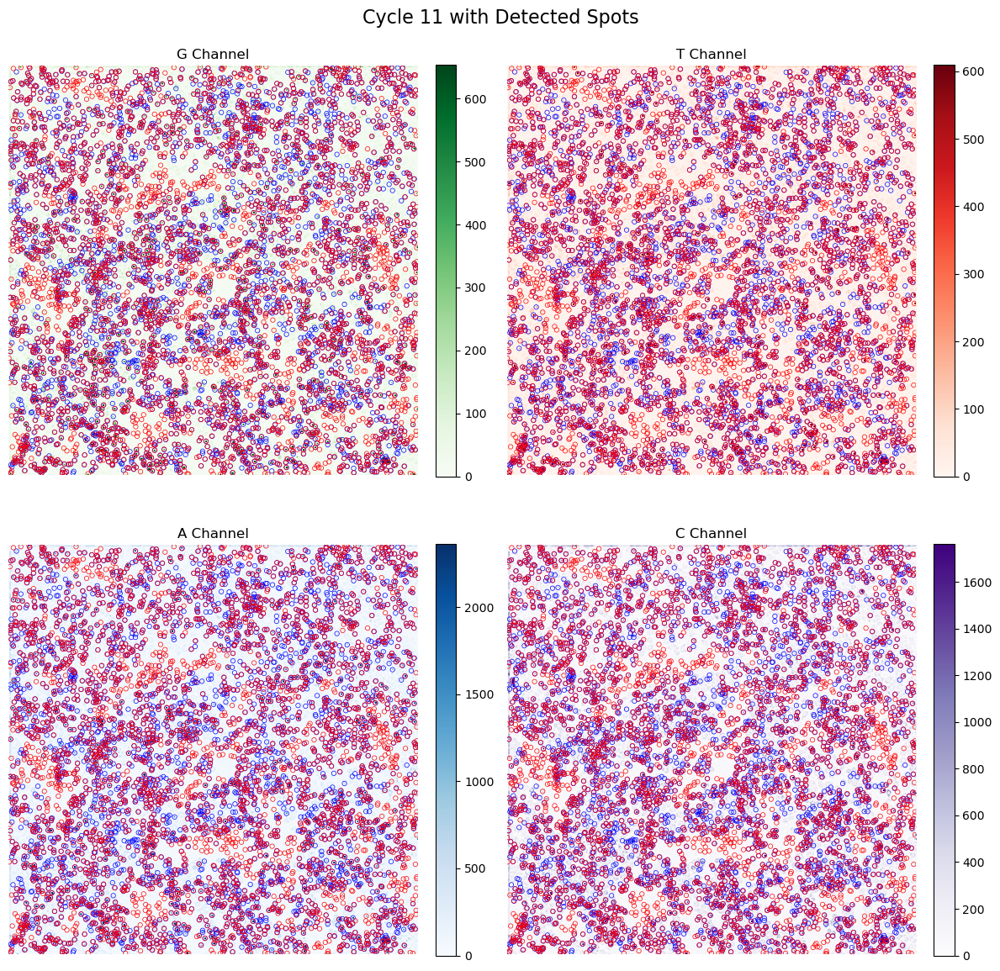

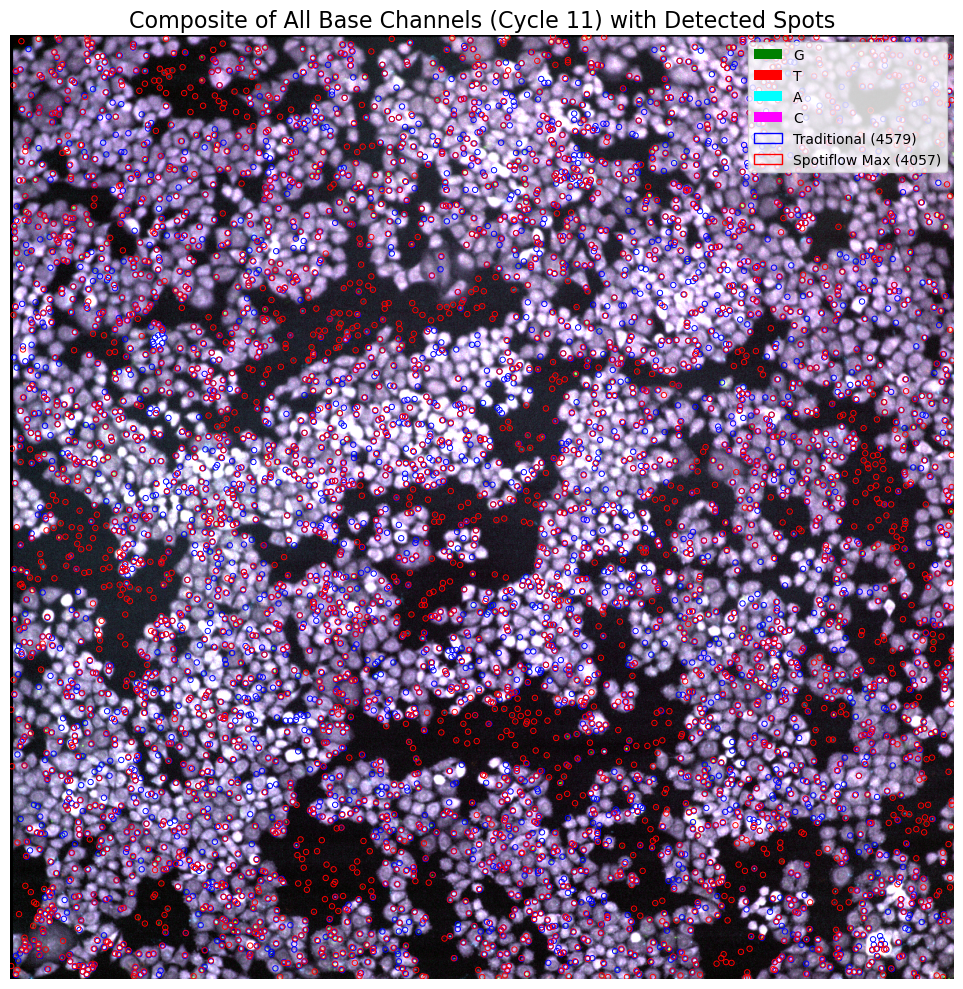

In [50]:
# Example usage
last_cycle_idx = aligned.shape[0] - 1

# Get coordinates from different methods
# Traditional method
traditional_coords = np.where(peaks > THRESHOLD_READS)
traditional_coords = np.array(list(zip(traditional_coords[0], traditional_coords[1])))

# Spotiflow methods
max_coords = np.where(peaks_max > 0)
max_coords = np.array(list(zip(max_coords[0], max_coords[1])))

# std_coords = np.where(peaks_std > 0)
# std_coords = np.array(list(zip(std_coords[0], std_coords[1])))

# Plot channel subplots with all three peak sets
fig_channels, axes = plot_channels_with_peaks(
    maxed_data=maxed[last_cycle_idx],
    peak_coords_list=[traditional_coords, max_coords],
    bases=BASES,
    cycle_number=SBS_CYCLES[last_cycle_idx],
    peak_colors=['blue', 'red'],
    peak_labels=['Traditional', 'Spotiflow Max']
)

# Plot composite with all three peak sets
fig_composite, ax = plot_composite_with_peaks(
    cycle_data=aligned[last_cycle_idx, 1:],  # Skip DAPI channel
    peak_coords_list=[traditional_coords, max_coords],
    bases=BASES,
    cycle_number=SBS_CYCLES[last_cycle_idx],
    peak_colors=['blue', 'red'],
    peak_labels=['Traditional', 'Spotiflow Max']
)

plt.show()

Traditional only: 1323 spots
Spotiflow only: 825 spots
Overlapping: 3256 spots


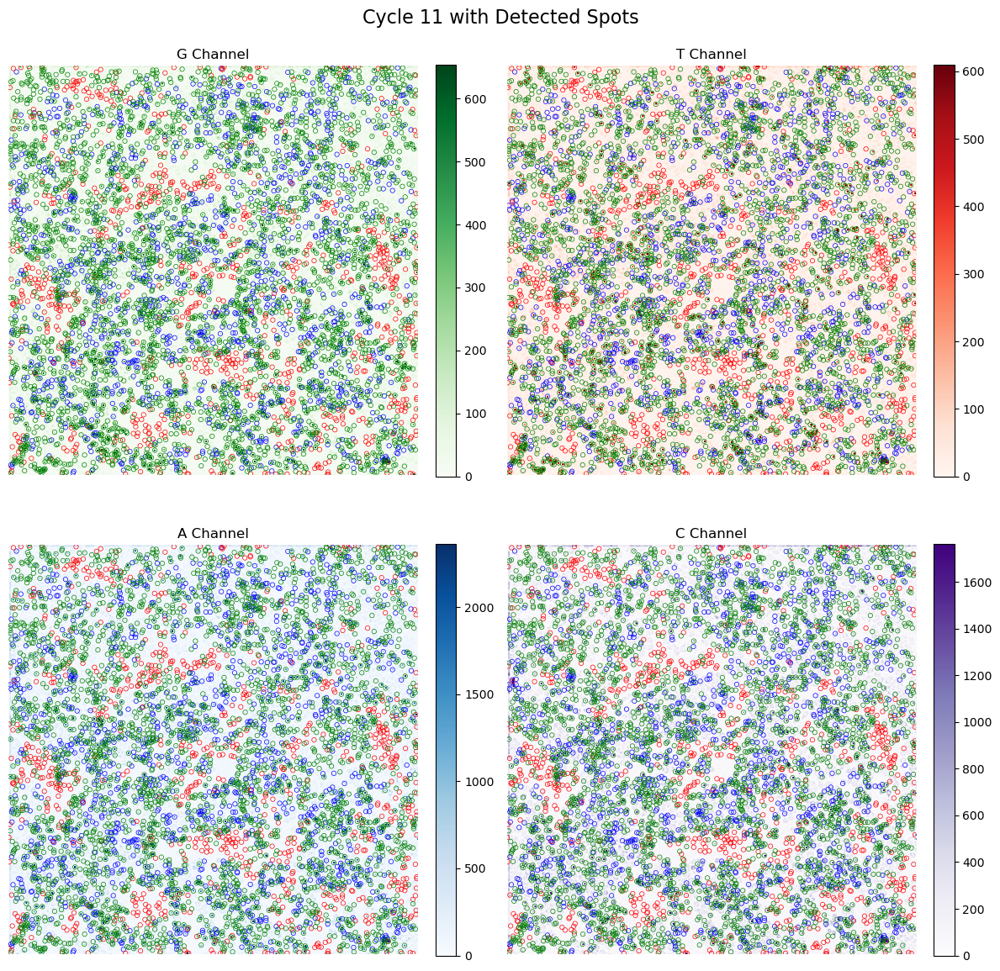

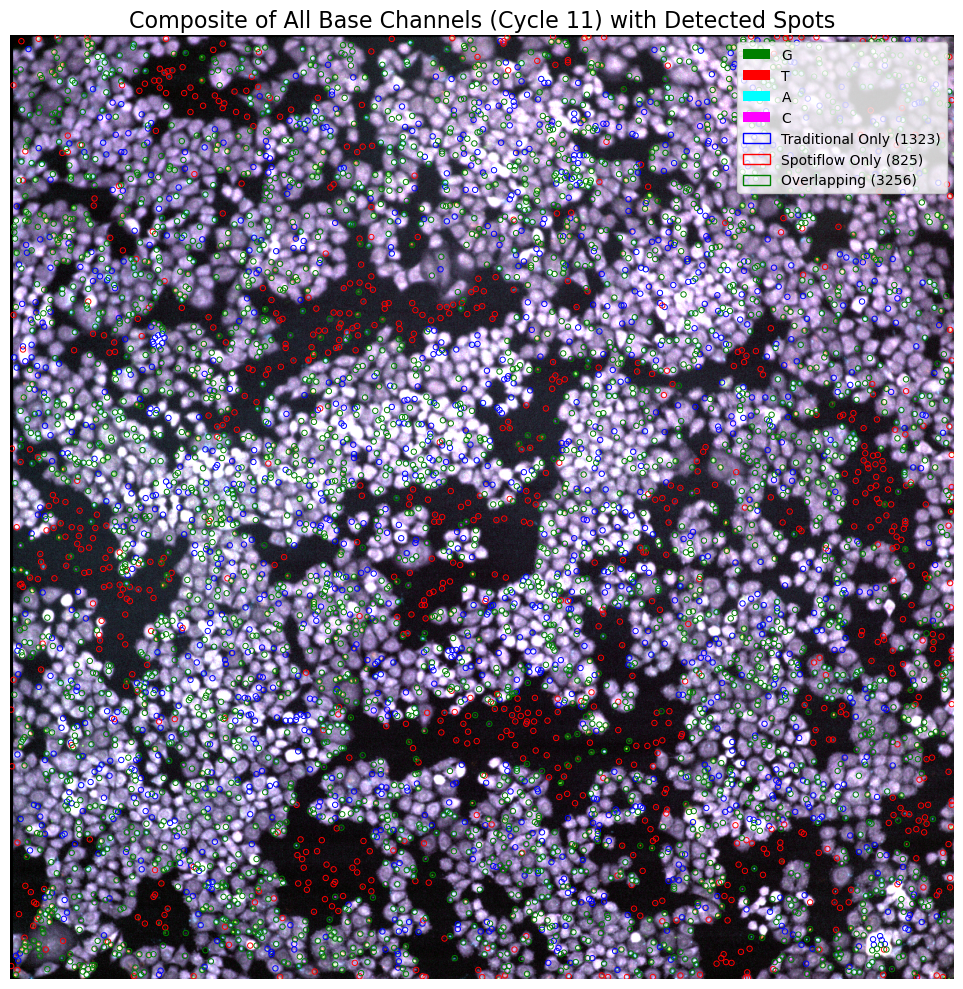

In [51]:
# Find unique spots
unique_traditional, unique_spotiflow, overlapping = find_unique_spots(
    traditional_coords, 
    max_coords,
    distance_threshold=3
)

print(f"Traditional only: {len(unique_traditional)} spots")
print(f"Spotiflow only: {len(unique_spotiflow)} spots")
print(f"Overlapping: {len(overlapping)} spots")

# Plot with unique and overlapping spots
fig_channels, axes = plot_channels_with_peaks(
    maxed_data=maxed[last_cycle_idx],
    peak_coords_list=[unique_traditional, unique_spotiflow, overlapping],
    bases=BASES,
    cycle_number=SBS_CYCLES[last_cycle_idx],
    peak_colors=['blue', 'red', 'green'],
    peak_labels=['Traditional Only', 'Spotiflow Only', 'Overlapping']
)

# Plot composite
fig_composite, ax = plot_composite_with_peaks(
    cycle_data=aligned[last_cycle_idx, 1:],  # Skip DAPI channel
    peak_coords_list=[unique_traditional, unique_spotiflow, overlapping],
    bases=BASES,
    cycle_number=SBS_CYCLES[last_cycle_idx],
    peak_colors=['blue', 'red', 'green'],
    peak_labels=['Traditional Only', 'Spotiflow Only', 'Overlapping']
)

plt.show()